In [35]:
from pdf2image import convert_from_bytes
import io, re
from google.oauth2 import service_account
import vertexai
from mimetypes import guess_type
from PyPDF2 import PdfReader
from receipt_detector import receipt_detector

# Example usage:
from vertexai.generative_models import (
    GenerationConfig,
    GenerativeModel,
    HarmCategory,
    HarmBlockThreshold,
    Image
)

print('V3')
# Vertex AI configuration
project_id = 'paper-ds-production'
credentials_file_path = '/home/yogi/Data Squad/Aril/APE/skilled-compass.json'
credentials = service_account.Credentials.from_service_account_file(credentials_file_path)
vertexai.init(project=project_id, credentials=credentials)
model = "gemini-1.5-flash"
multimodal_model = GenerativeModel(model)


safety_config = {
    HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: HarmBlockThreshold.BLOCK_NONE,
    HarmCategory.HARM_CATEGORY_HARASSMENT: HarmBlockThreshold.BLOCK_NONE,
    HarmCategory.HARM_CATEGORY_HATE_SPEECH: HarmBlockThreshold.BLOCK_NONE,
    HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: HarmBlockThreshold.BLOCK_NONE,
}

# Generation Config
config = GenerationConfig( temperature=0.0, top_p=1, top_k=32
)

def new_pipeline(list_bytes, custome_field_headers = [], custome_field_items = []):
    output_receipt = {'document_type':'receipt',
                     'cash_amount': '<amount that user should pay if any>',
                     'change_amount': '<change amount>',
                     'currency': '<currency>',
                     'line_item': [{'amount': '<total amount for the product>',
                                   'description': '<product name or description>',
                                   'price_per_unit': '<price per unit item>',
                                   'quantity': '<quantity of the item>'}],
                     'subtotal_amount': '<net amount or subtotal>',
                     'payment_type': '<payment type>',
                     'purchase_time': '<purchase time>',
                     'receipt_date': '<receipt date in YYYY-MM-DD format>',
                     'rounding_amount': '<rounding amount>',
                     'service_charge_amount': '<service charge amount>',
                     'supplier_address': '<supplier address>',
                     'supplier_name': '<supplier name>',
                     'supplier_phone': '<supplier phone>',
                     'total_amount': '<total amount>',
                     'tax_amount': '<total tax amount>'}
    output_invoice = {'document_type':'invoice',
                      'customer_address':'<customer_address>',
                        'customer_email':'<customer_email>',
                        'customer_name':'<customer_name>',
                        'customer_phone':'<customer_phone>',
                        'delivery_fee_amount':'<delivery_fee_amount>',
                          "fully_paid_amount": "<Total amount paid by the user, fully settling the invoice. This may be referred to as 'Lunas' or other similar terms indicating complete payment.>",
                      'down_payment_amount':"<down_payment_amount>",
                        'discount_amount':'<discount_amount>',
                        'grand_total':'<grand_total>',
                        'invoice_date':'<invoice_date YYYY-MM-DD format>',
                        'invoice_due_date':'<invoice_due_date YYYY-MM-DD format>',
                        'invoice_number':'<invoice_number>',
                        'items': [{ 'item_code':'<item_code>',
                                    'item_product_name':'<product name>',
                                    'item_description':'<description product>',
                                    'item_discount':'<item_discount>',
                                    'item_price_unit':'<item_price_unit>',
                                    'item_quantity':'<item_quantity>',
                                    'item_tax':'<item_tax>',
                                    'item_total_amount':'<item_total_amount>',
                                    'item_unit':'<item_unit>' }],
                        'purchase_order_number':'<purchase_order_number>',
                        'subtotal_amount':'<subtotal_amount>',
                        'supplier_account_name':'<supplier_account_name>',
                        'supplier_address':'<supplier_address>',
                        'supplier_bank':'<supplier_bank>',
                        'supplier_bank_account':'<supplier_bank_account>',
                        'supplier_email':'<supplier_email>',
                        'supplier_name':'<supplier_name>',
                        'supplier_npwp':'<supplier_npwp>',
                        'supplier_phone':'<supplier_phone>',
                        'tax_amount':'<tax_amount>',
                        'tax_inclusive_amount':'<tax_inclusive_amount>',
                        'total_amount':'<total_amount>'}  

    for field in custome_field_headers:
        output_receipt.update({field:f"<{field}>"})
        output_invoice.update({field:f"<{field}>"})
        
    for field in custome_field_items:
        output_receipt['line_item'][0].update({field:f"<{field}>"})
        output_invoice['items'][0].update({field:f"<{field}>"})            
    
    
#     return output_receipt
    # Create an image object from the file bytes
    contents = []
    for content in list_bytes:
        contents.append(Image.from_bytes(content))

    print(contents)
    # Prepare the contents for processing
    prompt = f"""Please analyze the following image above using OCR and classify the document_type of that image. 
    Based on your analysis, return the appropriate result:

    If the document_type is "receipt":
    Return a JSON response:
    {output_receipt}

    Else if the document_type is "invoice":
    Return a JSON response:
    {output_invoice}

    Else if not "receipt" and "invoice":
    Return a JSON response:
    {{
      "document_type": "<document_type>",
      "confidence_score": <value between 0 and 1>,
      "explanation": "reason"
    }}
    """


    contents.append(prompt)

    # Generate content using the multimodal model
    responses = multimodal_model.generate_content(contents,
                                                  safety_settings=safety_config, 
                                                  generation_config=config, 
                                                  stream=True)


    full_result = ''

    for response in responses:
        full_result += response.text

    usage = {}   
    for i in str(response.usage_metadata).split('\n'):
        if i.strip():
            x = i.split(':')
            usage.update({x[0].strip():int(x[1].strip())})
            
    null = '-'
    try:
        result = eval(re.findall(r'\{.*\}',full_result, flags =re.I|re.S )[0])
    except:
        try:
            result = eval(re.findall(r'\[\{.*\}\]',full_result, flags =re.I|re.S )[0])
        except:
            return full_result
    result.update({'usage':usage})
    return result

def split_pdf_per_15_pages_to_images(pdf_bytes):
    """
    Mengonversi PDF menjadi gambar per 15 halaman, input berupa bytes dari PDF.

    Parameters:
    - pdf_bytes: bytes, bytes dari file PDF

    Returns:
    - all_images_bytes: list, daftar bytes dari gambar yang dihasilkan
    """
    # Membuat reader object untuk membaca PDF dari bytes
    reader = PdfReader(io.BytesIO(pdf_bytes))
    total_pages = len(reader.pages)
    
    # Menghitung jumlah file output
    num_files = (total_pages + 14) // 15  # Memastikan semua halaman tercover dengan pembulatan ke atas
    
    all_images_bytes = []
    
    # Memproses setiap grup 15 halaman
    for i in range(num_files):
        # Menentukan halaman yang akan diproses
        start_page = i * 15
        end_page = min(start_page + 15, total_pages)
        
        # Mengkonversi halaman ke gambar dari bytes
        images = convert_from_bytes(pdf_bytes, first_page=start_page + 1, last_page=end_page)
        
        # Mengambil bytes dari setiap gambar
        for image in images:
            img_byte_arr = io.BytesIO()
            image.save(img_byte_arr, format='PNG')
            img_bytes = img_byte_arr.getvalue()
            all_images_bytes.append(img_bytes)
        
        print(f"Part {i + 1} processed with pages from {start_page + 1} to {end_page}.")
    
    return all_images_bytes

def main_process(filename, custome_field_headers=None, custome_field_items=None):
    """
    Main process function to handle PDF and image files.

    Parameters:
    ----------
    filename : str
        The path to the file to process (image or PDF).
    custome_field_headers : list of str, optional
        Custom field headers for the new pipeline.
    custome_field_items : list of str, optional
        Custom field items for the new pipeline.

    Returns:
    -------
    dict or list
        Processed results or error information.
    """
    if custome_field_headers is None:
        custome_field_headers = []
    if custome_field_items is None:
        custome_field_items = []

    mime_type, _ = guess_type(filename)
    print(mime_type)

    try:
        custome_field_headers = [j for i in custome_field_headers if i for j in i.split(',')]
        custome_field_items = [j for i in custome_field_items if i for j in i.split(',')]

        if mime_type == 'application/pdf':
            with open(filename, 'rb') as f:
                content_file = f.read()
            
            list_bytes = split_pdf_per_15_pages_to_images(content_file)
            return new_pipeline(list_bytes, custome_field_headers=custome_field_headers, custome_field_items=custome_field_items)
        else:
            yolo_model_path = 'models/receipt_detector.pt'
            list_bytes = receipt_detector(filename, yolo_model_path)
            print(f'detected {len(list_bytes)} receipt')

            final_result = [
                new_pipeline([LB], custome_field_headers=custome_field_headers, custome_field_items=custome_field_items)
                for LB in list_bytes
            ]
            return final_result
    except Exception as e:
        return {'status_code': 500, 'reason': str(e)}


V3


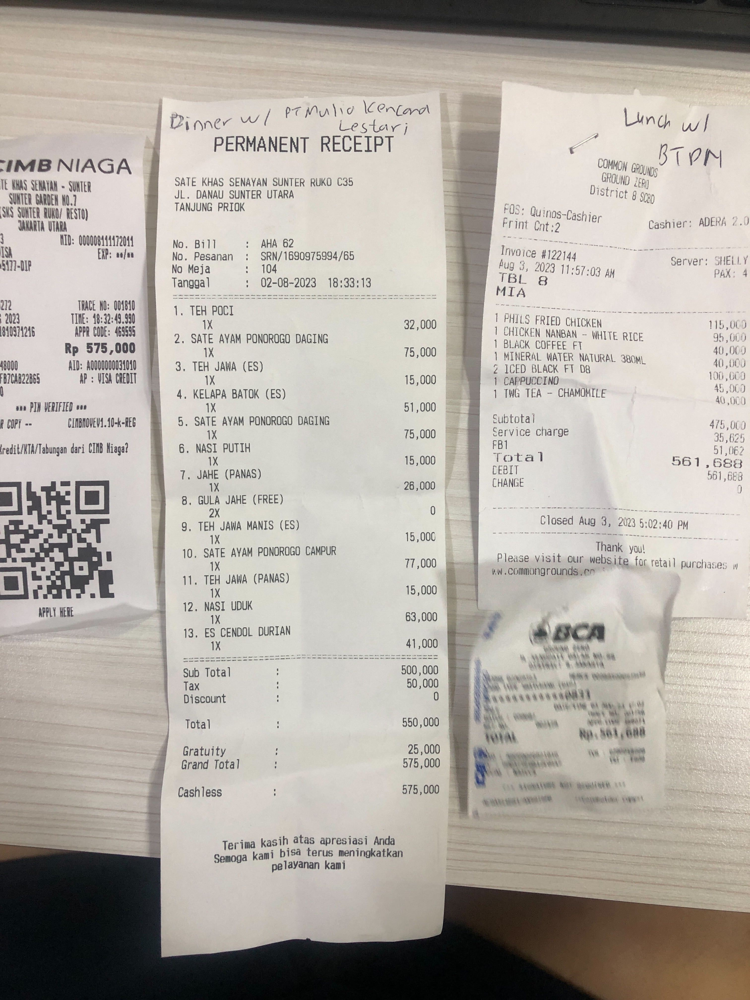

image/jpeg


KeyboardInterrupt: 

In [17]:
import os

from IPython.display import display
from PIL import Image as Image_PIL

def show_image(file_path):
    """
    Display an image from a local file path in a Jupyter Notebook.
    
    Parameters:
    - file_path (str): The path to the image file.
    """
    try:
        img = Image_PIL.open(file_path)
        display(img)
    except Exception as e:
        print(f"Error: {e}")
file_path = '../photo_24-04-03 10_40_48.jpg'
file_path = 'sample/Entertain 10. Anthony (3).jpg'
file_path = 'sample/Copy of Copy of 076_BLUE-KRM_INV_VIII-23 -- Andi Mustari.pdf'
# Example usage:
show_image(file_path)

main_process(file_path)

In [36]:
file_path = 'sample/Copy of Copy of 076_BLUE-KRM_INV_VIII-23 -- Andi Mustari.pdf'
xx = main_process(file_path)

application/pdf
Part 1 processed with pages from 1 to 1.


In [37]:
xx

{'document_type': 'invoice',
 'customer_address': 'Jl. Beringin Maju RT. 001 RW. 001 Seuneubok, Johan Pahlawan Kab. Aceh Barat Aceh',
 'customer_email': None,
 'customer_name': 'ANDI MUSTARI',
 'customer_phone': None,
 'delivery_fee_amount': None,
 'fully_paid_amount': None,
 'down_payment_amount': '450.450',
 'discount_amount': None,
 'grand_total': '2.500.000',
 'invoice_date': '2023-08-01',
 'invoice_due_date': None,
 'invoice_number': '076/BLUE-KRM/INV/VIII-23',
 'items': [{'item_code': None,
   'item_product_name': 'Training PLTS (3-5 Agustus 2023) - Universitas Ahmad Dahlan, Yogyakarta',
   'item_description': None,
   'item_discount': None,
   'item_price_unit': '2.702.703',
   'item_quantity': '1',
   'item_tax': None,
   'item_total_amount': '2.702.703',
   'item_unit': 'Orang'}],
 'purchase_order_number': None,
 'subtotal_amount': '2.702.703',
 'supplier_account_name': None,
 'supplier_address': 'Jl.Bratang Binangun III No.36 RT.007 RW.008 Kel. Baratajaya Kec.Gubeng, Surabaya

# detect multiple document

In [1]:
from receipt_detector import receipt_detector

# Example usage:
if __name__ == "__main__":
    yolo_model_path = 'models/receipt_detector.pt'
    result_bytes = receipt_detector('sample/Entertain 10. Anthony (3).jpg', yolo_model_path)


0: 640x480 3 papers, 121.3ms
Speed: 139.1ms preprocess, 121.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


In [57]:
os.listdir('sample')

['Entertain 10. Anthony (3).jpg',
 '1012INVEPS122024_zcwxeanp9crltvx8px75ltqu3hu5bsra8xmtihnzeqyr2kvo6a.pdf',
 'Entertain 14. Fajar Handra Halim (2).jpg',
 'Copy of Copy of 076_BLUE-KRM_INV_VIII-23 -- Andi Mustari.pdf',
 'materai.jpg',
 'e gaji apps 05. Kinantia Subiantoro (2).png',
 'e gaji apps 05. Tatiana Djukardi (1).png',
 'Entertain 13. Fajar Handra Halim (4).jpg',
 'WhatsApp Image 2024-06-29 at 17.40.08_040e3125.jpg',
 'e gaji apps 05. Tatiana Djukardi (3).png',
 'Copy of AGS1.jpeg']

In [59]:
import requests
from mimetypes import guess_type
FILENAME = 'sample/Entertain 10. Anthony (3).jpg'
FILENAME = 'sample/materai.jpg'
FILENAME = 'sample/1012INVEPS122024_zcwxeanp9crltvx8px75ltqu3hu5bsra8xmtihnzeqyr2kvo6a.pdf'
#ganti FILENAME nya aja
with open(FILENAME,'rb') as f:
    image_bytes = f.read()

mime_type, _ = guess_type(FILENAME)

# URL endpoint FastAPI
url = "http://34.101.213.23:2225/process/"

# Data formulir
custome_field_headers = []
custome_field_items = []

# Membaca file

files = {
    'content': (FILENAME, image_bytes, mime_type)
}
data = {
    "custome_field_headers": [],
    "custome_field_items": []
}

# Mengirim permintaan POST
response = requests.post(url, files=files, data=data)

# Menampilkan hasil
ocr_gemini = (response.json())
ocr_gemini

{'document_type': 'invoice',
 'customer_address': 'Jl. Raya Cibingbin, Jawa Barat (D.Top), Kota Sukabumi,  Kaler 43152',
 'customer_email': None,
 'customer_name': 'PT. Azka Cahaya Putera (D.Top)',
 'customer_phone': None,
 'delivery_fee_amount': None,
 'fully_paid_amount': None,
 'down_payment_amount': None,
 'discount_amount': None,
 'grand_total': '202.779.675',
 'invoice_date': '2023-12-18',
 'invoice_due_date': None,
 'invoice_number': '1021/INV/EPS/12/2023',
 'items': [{'item_code': None,
   'item_product_name': 'Ayam Marinasi',
   'item_description': None,
   'item_discount': None,
   'item_price_unit': '31.500',
   'item_quantity': '6.000',
   'item_tax': None,
   'item_total_amount': '210.095.675',
   'item_unit': None},
  {'item_code': None,
   'item_product_name': 'Selasih Susu Produksi',
   'item_description': None,
   'item_discount': None,
   'item_price_unit': '31.500',
   'item_quantity': '6.000',
   'item_tax': None,
   'item_total_amount': '83.160.000',
   'item_unit'

In [58]:
os.path.isfile(FILENAME)

True